- Estrazione della slice Z=12...


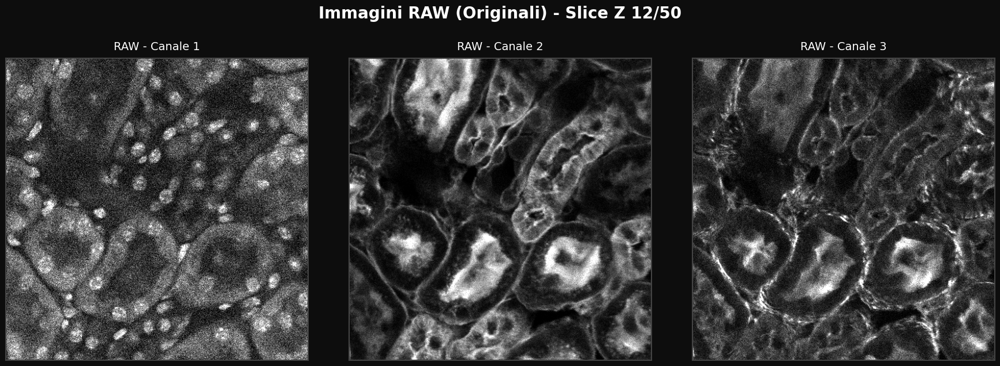

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import os
from pathlib import Path

# ── 0. Configurazione Parametri ──────────────────────────────────────────────
CONFIG = {
    "folder_path": "/Users/francesco/Repositories /CNR_SNR_3channels",
    "file_ch1": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch1.tif",
    "file_ch2": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch2.tif",
    "file_ch3": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch3.tif",
    "nomi_canali": ["Canale 1", "Canale 2", "Canale 3"],
    "z_target": 11,       # Indice Python 11 corrisponde alla Z 12/50
    "cmap_visual": "gray" # Scala di grigi globale
}
# ────────────────────────────────────────────────────────────────────────────

os.chdir(CONFIG["folder_path"])
lista_file = [CONFIG["file_ch1"], CONFIG["file_ch2"], CONFIG["file_ch3"]]

immagini_originali = []

# ## 1. Lettura Z-Stacks ed Estrazione Slice Z=12
print(f"- Estrazione della slice Z={CONFIG['z_target'] + 1}...")

for fname in lista_file:
    p = Path(fname)
    if not p.exists():
        raise FileNotFoundError(f"! Impossibile trovare il file: {p.absolute()}")
    
    stack_3d = io.imread(p)
    # Estrae la slice Z desiderata (gestendo sia 3D che 2D come fallback)
    img_raw = stack_3d[CONFIG["z_target"], :, :] if stack_3d.ndim == 3 else stack_3d
    immagini_originali.append(img_raw)

# ## 2. Visualizzazione delle immagini originali
fig, axes = plt.subplots(1, 3, figsize=(18, 6), facecolor="#0d0d0d")
fig.suptitle(f"Immagini RAW (Originali) - Slice Z {CONFIG['z_target'] + 1}/50", 
             color="white", fontsize=20, fontweight="bold", y=1.05)

for i in range(3):
    ax = axes[i]
    
    # Calcolo dei percentili solo per una corretta visualizzazione a schermo
    p_low, p_high = np.percentile(immagini_originali[i], (1, 99.5))
    
    # Plot dell'immagine originale con regolazione visiva del contrasto
    ax.imshow(immagini_originali[i], cmap=CONFIG["cmap_visual"], vmin=p_low, vmax=p_high)
    ax.set_title(f"RAW - {CONFIG['nomi_canali'][i]}", color="white", fontsize=14, pad=10)
    
    # Formattazione grafica
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_edgecolor("#444444")
        spine.set_linewidth(1.5)

plt.tight_layout()
plt.show()

────────────────────────────────────────────────────────────────────
  PSF CALCOLATA
────────────────────────────────────────────────────────────────────
  Pixel size    : 0.2930 µm
  Risoluzione   : 0.7700 µm
  Sigma PSF     : 1.1160 px
  Kernel size   : 7×7 px

────────────────────────────────────────────────────────────────────
  CARICAMENTO SLICE Z=12/50
────────────────────────────────────────────────────────────────────
  ✓ ani_10ripetizioni_50mW_512px_770nm_Ch1.tif  (512, 512)  dtype=int16
  ✓ ani_10ripetizioni_50mW_512px_770nm_Ch2.tif  (512, 512)  dtype=int16
  ✓ ani_10ripetizioni_50mW_512px_770nm_Ch3.tif  (512, 512)  dtype=int16

────────────────────────────────────────────────────────────────────
  DENOISING IN CORSO…
────────────────────────────────────────────────────────────────────

  ▶ Ch1 (GaAsP)   σ=0.05744   SNR_raw≈8.7 dB
    Wiener      SSIM=0.6693  PSNR= 24.9 dB  ΔSNR= +3.8 dB  (0.1s)
    R-Lucy      SSIM=0.7019  PSNR= 24.5 dB  ΔSNR= +3.5 dB  (0.0s)
    TV         

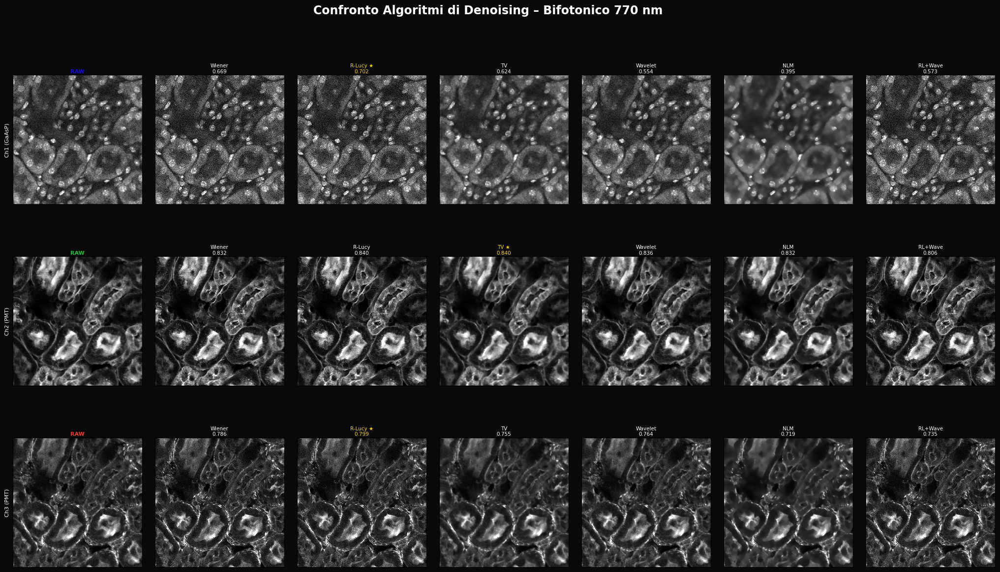


  ✓ 01_confronto_completo.png


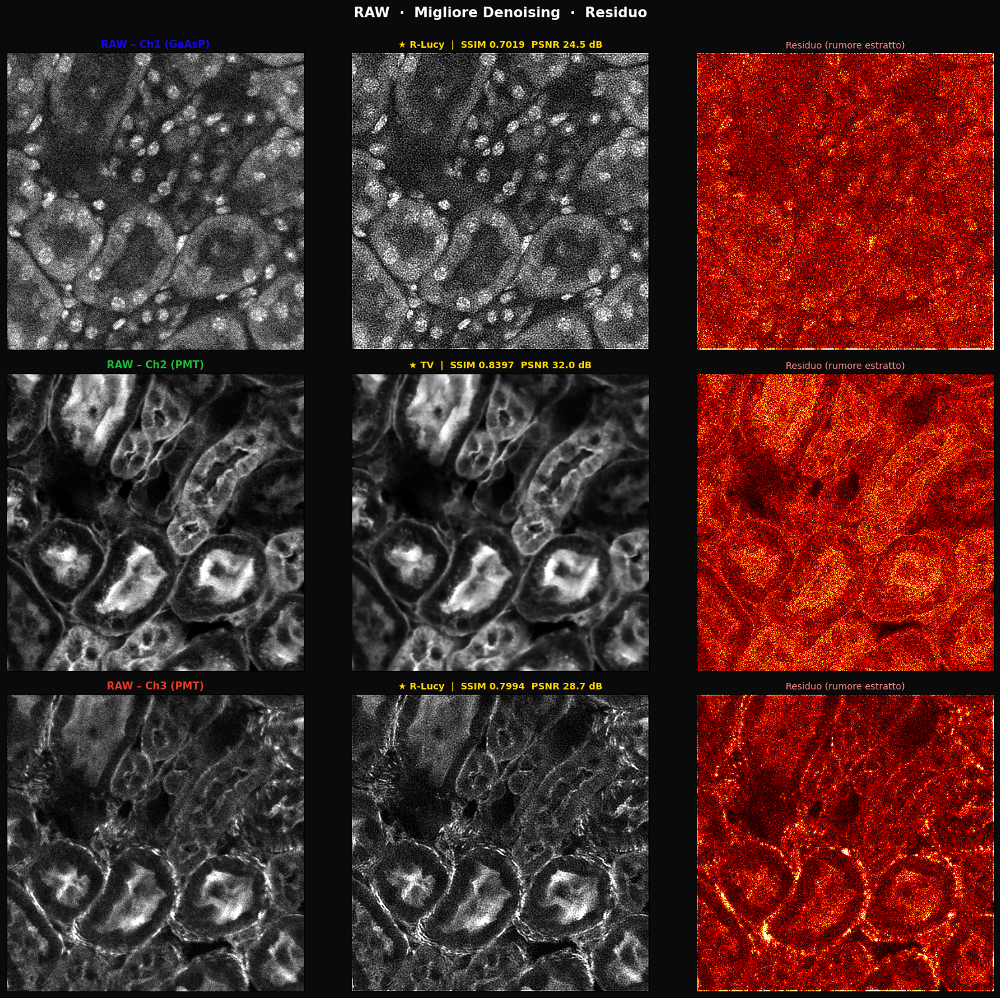

  ✓ 02_migliore_per_canale.png


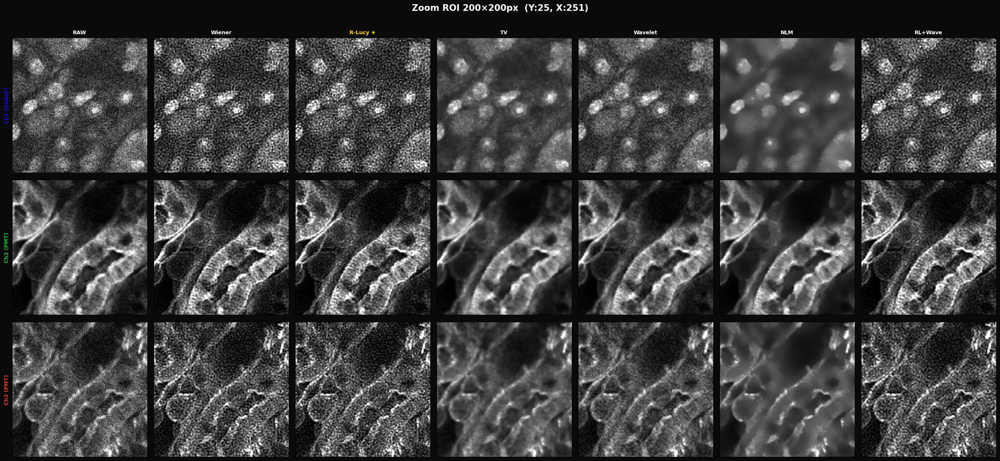

  ✓ 03_zoom_roi.png


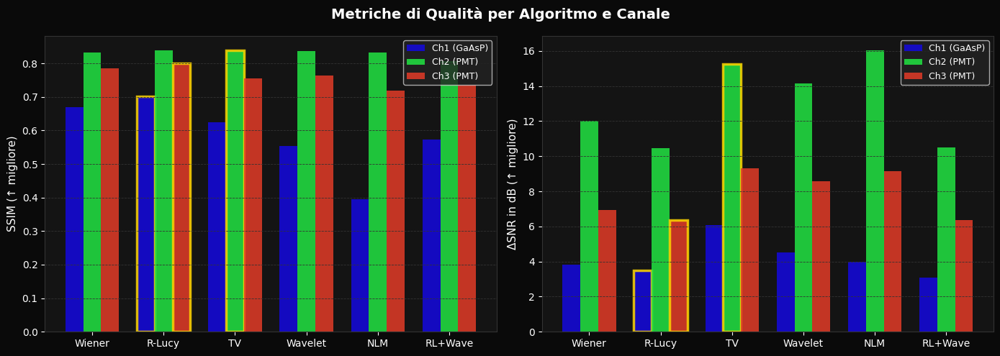

  ✓ 04_metriche.png


In [ ]:
"""
╔══════════════════════════════════════════════════════════════════════════════╗
║      DENOISING PIPELINE – MICROSCOPIA BIFOTONICA 3 CANALI (770 nm)           ║
║                                                                              ║
║  Algoritmi (dal notebook + nuovi):                                           ║
║    1. Wiener Filter            (deconvolution + regularizzazione)            ║
║    2. Richardson-Lucy          (deconvolution iterativa, rumore Poisson)     ║
║    3. TV Chambolle             (pure denoising, preserva bordi)              ║
║    4. Wavelet BayesShrink      (pure denoising, multi-scala)                 ║
║    5. Non-Local Means (NLM)    (NUOVO – ottimo per fluorescenza)             ║
║    6. RL + Wavelet             (PIPELINE COMBINATA – best overall)           ║
║                                                                              ║
║  PSF calcolata fisicamente da λ, NA e pixel size estratto dal nome file.     ║
╚══════════════════════════════════════════════════════════════════════════════╝
"""

import os, re, time, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from scipy import ndimage
from skimage import io, restoration, img_as_float, img_as_uint, color
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

warnings.filterwarnings("ignore")

# ═══════════════════════════════════════════════════════════════════════════════
# 0. CONFIGURAZIONE
# ═══════════════════════════════════════════════════════════════════════════════
CONFIG = {
    # Percorsi
    "folder_path":  "/Users/francesco/Repositories /CNR_SNR_3channels",
    "file_ch1": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch1.tif",
    "file_ch2": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch2.tif",
    "file_ch3": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch3.tif",

    # Dati acquisizione
    "z_target":           11,      # Slice Python 11 → Z 12/50
    "wavelength_nm":     770.0,    # Lunghezza d'onda laser [nm]
    "numerical_aperture":  0.5,    # NA obiettivo (cambia se usi 60x oil → 1.4)

    # Parametri algoritmi
    "wiener_balance":     0.01,   # Forza regolarizzazione Wiener (↑ = più smooth)
    "rl_iterations":      15,     # Iter. Richardson-Lucy (↑ = più nitido ma + rumore)
    "tv_weight":          0.03,   # Peso TV (>0.1 = effetto cartoon)
    "tv_max_iter":        300,
    "wavelet_type":      "coif5", # 'coif5','db4','sym8' – curve, ideali per biologia
    "wavelet_strength":   1.5,    # Moltiplicatore sigma wavelet (1=standard)
    "nlm_patch_size":     5,
    "nlm_patch_dist":     6,

    # Output
    "output_dir":        "./denoised_output",
    "salva_tiff":         True,
    "cmap":              "gray",
    "nomi_canali":       ["Ch1 (GaAsP)", "Ch2 (PMT)", "Ch3 (PMT)"],
    "colori":            ["#1409df", "#21e442cd", "#e33b28"],
}

os.makedirs(CONFIG["output_dir"], exist_ok=True)
os.chdir(CONFIG["folder_path"])


# ═══════════════════════════════════════════════════════════════════════════════
# 1. PSF FISICA – da λ, NA e pixel size estratto dal nome file (Cell 15)
# ═══════════════════════════════════════════════════════════════════════════════
def calcola_psf(filepath: str, wavelength_nm: float, na: float):
    """
    Restituisce (psf_matrix, sigma_px, pixel_size_um).
    Pixel size estratto dal pattern NNNmic_...MMMpx nel nome file.
    Formula Abbe: d = λ/(2·NA)  →  σ_gauss = d/2.355  →  σ_px = σ/px_um
    """
    m_mic = re.search(r"(\d+)mic", filepath)
    m_px  = re.search(r"(\d+)px",  filepath)
    if m_mic and m_px:
        px_um = float(m_mic.group(1)) / float(m_px.group(1))
    else:
        print("  Pixel size non trovato nel nome file, uso 0.293 µm")
        px_um = 0.293

    sigma_um = ((wavelength_nm / 1000.0) / (2.0 * na)) / 2.355
    sigma_px = sigma_um / px_um
    size     = max(int(round(sigma_px * 6)) | 1, 3)
    kernel   = np.zeros((size, size))
    kernel[size // 2, size // 2] = 1.0
    psf      = ndimage.gaussian_filter(kernel, sigma=sigma_px)
    return psf, sigma_px, px_um


lista_file = [CONFIG["file_ch1"], CONFIG["file_ch2"], CONFIG["file_ch3"]]
psf, sigma_px, px_um = calcola_psf(
    lista_file[0], CONFIG["wavelength_nm"], CONFIG["numerical_aperture"]
)

print("─" * 68)
print("  PSF CALCOLATA")
print("─" * 68)
print(f"  Pixel size    : {px_um:.4f} µm")
print(f"  Risoluzione   : {(CONFIG['wavelength_nm']/1000)/(2*CONFIG['numerical_aperture']):.4f} µm")
print(f"  Sigma PSF     : {sigma_px:.4f} px")
print(f"  Kernel size   : {psf.shape[0]}×{psf.shape[1]} px\n")


# ═══════════════════════════════════════════════════════════════════════════════
# 2. CARICAMENTO Z-STACK
# ═══════════════════════════════════════════════════════════════════════════════
print("─" * 68)
print(f"  CARICAMENTO SLICE Z={CONFIG['z_target']+1}/50")
print("─" * 68)

canali_raw = []
for fname in lista_file:
    p = Path(fname)
    if not p.exists():
        raise FileNotFoundError(f"File non trovato: {p.absolute()}")
    stack    = io.imread(p)
    img      = stack[CONFIG["z_target"]] if stack.ndim == 3 else stack
    img_f    = img_as_float(img)
    vmin, vmax = img_f.min(), img_f.max()
    img_norm = (img_f - vmin) / (vmax - vmin) if vmax > vmin else img_f
    canali_raw.append(img_norm.astype(np.float32))
    print(f"  ✓ {fname[-42:]}  {img.shape}  dtype={img.dtype}")
print()


# ═══════════════════════════════════════════════════════════════════════════════
# 3. FUNZIONI ALGORITMI
# ═══════════════════════════════════════════════════════════════════════════════

def applica_wiener(img, psf, balance):
    return restoration.wiener(img, psf, balance=balance)

def applica_rl(img, psf, n_iter):
    return np.clip(
        restoration.richardson_lucy(img, psf, num_iter=n_iter, clip=False), 0, 1
    )

def applica_tv(img, weight, max_iter):
    return restoration.denoise_tv_chambolle(
        img, weight=weight, eps=0.0002, max_num_iter=max_iter, channel_axis=None
    )

def applica_wavelet(img, sigma_est, strength, wavelet):
    return restoration.denoise_wavelet(
        img,
        sigma=sigma_est * strength,
        wavelet=wavelet,
        mode="soft",           # 'soft' più fluido di 'hard' su tessuti biologici
        method="BayesShrink",
        rescale_sigma=True,
        channel_axis=None,
    )

def applica_nlm(img, sigma_est):
    """
    Non-Local Means: confronta patch simili in tutta l'immagine.
    Eccellente per strutture ripetute (fibre, membrane, mitocondri).
    """
    h = max(sigma_est * 0.9, 0.005)
    return restoration.denoise_nl_means(
        img,
        h=h,
        patch_size=CONFIG["nlm_patch_size"],
        patch_distance=CONFIG["nlm_patch_dist"],
        fast_mode=True,
        sigma=sigma_est,
        preserve_range=True,
    )

def applica_rl_wavelet(img, psf, n_iter, sigma_est, strength, wavelet):
    """
    PIPELINE COMBINATA – la più efficace per microscopia bifotonica:
      1) Richardson-Lucy: corregge la PSF e ripristina la nitidezza
      2) Wavelet:         rimuove il rumore residuo amplificato dalla deconv
    """
    deconv = applica_rl(img, psf, n_iter)
    return applica_wavelet(deconv, sigma_est, strength, wavelet)


# ═══════════════════════════════════════════════════════════════════════════════
# 4. ESECUZIONE SUI 3 CANALI
# ═══════════════════════════════════════════════════════════════════════════════
print("─" * 68)
print("  DENOISING IN CORSO…")
print("─" * 68)

NOMI_ALGO = ["Wiener", "R-Lucy", "TV", "Wavelet", "NLM", "RL+Wave"]
risultati  = [{} for _ in range(3)]

for ch, img in enumerate(canali_raw):
    sigma_est = float(restoration.estimate_sigma(img, average_sigmas=True))
    snr_raw   = 20 * np.log10(img.mean() / (sigma_est + 1e-9))
    print(f"\n  ▶ {CONFIG['nomi_canali'][ch]}   σ={sigma_est:.5f}   SNR_raw≈{snr_raw:.1f} dB")

    # Lista (nome, callable) per mantenere i lambda semplici
    piani = [
        ("Wiener",  lambda i=img:             applica_wiener(i, psf, CONFIG["wiener_balance"])),
        ("R-Lucy",  lambda i=img:             applica_rl(i, psf, CONFIG["rl_iterations"])),
        ("TV",      lambda i=img:             applica_tv(i, CONFIG["tv_weight"], CONFIG["tv_max_iter"])),
        ("Wavelet", lambda i=img, s=sigma_est: applica_wavelet(i, s, CONFIG["wavelet_strength"], CONFIG["wavelet_type"])),
        ("NLM",     lambda i=img, s=sigma_est: applica_nlm(i, s)),
        ("RL+Wave", lambda i=img, s=sigma_est: applica_rl_wavelet(
                        i, psf, CONFIG["rl_iterations"], s,
                        CONFIG["wavelet_strength"], CONFIG["wavelet_type"])),
    ]

    for nome, funzione in piani:
        t0  = time.time()
        res = np.clip(funzione(), 0, 1).astype(np.float32)
        dt  = time.time() - t0

        ssim_v    = ssim(img, res, data_range=1.0)
        psnr_v    = psnr(img, res, data_range=1.0)
        delta_snr = 20 * np.log10(np.std(img) / (np.std(img - res) + 1e-9))

        risultati[ch][nome] = {
            "img": res, "ssim": ssim_v,
            "psnr": psnr_v, "snr_db": delta_snr, "t": dt
        }
        print(f"    {nome:10s}  SSIM={ssim_v:.4f}  PSNR={psnr_v:5.1f} dB"
              f"  ΔSNR={delta_snr:+5.1f} dB  ({dt:.1f}s)")


# ═══════════════════════════════════════════════════════════════════════════════
# 5. RIEPILOGO MIGLIORE
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "─" * 68)
print("  MIGLIORE PER CANALE (in base a SSIM)")
print("─" * 68)

migliori = []
for ch in range(3):
    best = max(risultati[ch], key=lambda n: risultati[ch][n]["ssim"])
    migliori.append(best)
    v = risultati[ch][best]
    print(f"  {CONFIG['nomi_canali'][ch]:14s}  → {best:10s}"
          f"  SSIM={v['ssim']:.4f}  PSNR={v['psnr']:.1f} dB")


# ═══════════════════════════════════════════════════════════════════════════════
# FIGURA 1 – CONFRONTO COMPLETO
# ═══════════════════════════════════════════════════════════════════════════════
DARK = "#0a0a0a"
fig = plt.figure(figsize=(26, 13), facecolor=DARK)
fig.suptitle("Confronto Algoritmi di Denoising – Bifotonico 770 nm",
             color="white", fontsize=17, fontweight="bold", y=0.99)

outer = gridspec.GridSpec(3, 1, figure=fig, hspace=0.4)
for ch in range(3):
    inner = gridspec.GridSpecFromSubplotSpec(
        1, len(NOMI_ALGO) + 1, subplot_spec=outer[ch], wspace=0.03
    )
    img  = canali_raw[ch]
    p1, p99 = np.percentile(img, (1, 99.5))

    ax = fig.add_subplot(inner[0])
    ax.imshow(img, cmap=CONFIG["cmap"], vmin=p1, vmax=p99)
    ax.set_title("RAW", color=CONFIG["colori"][ch], fontsize=8, fontweight="bold", pad=3)
    ax.set_ylabel(CONFIG["nomi_canali"][ch], color="white", fontsize=8, labelpad=4)
    ax.set_xticks([]); ax.set_yticks([])

    for j, nome in enumerate(NOMI_ALGO):
        d  = risultati[ch][nome]
        ax = fig.add_subplot(inner[j + 1])
        ax.imshow(d["img"], cmap=CONFIG["cmap"], vmin=p1, vmax=p99)
        stella  = " ★" if nome == migliori[ch] else ""
        ax.set_title(f"{nome}{stella}\n{d['ssim']:.3f}",
                     color="gold" if stella else "white", fontsize=7.5, pad=3)
        ax.set_xticks([]); ax.set_yticks([])

plt.savefig(f"{CONFIG['output_dir']}/01_confronto_completo.png",
            dpi=150, bbox_inches="tight", facecolor=DARK)
plt.show()
print(f"\n  ✓ 01_confronto_completo.png")


# ═══════════════════════════════════════════════════════════════════════════════
# FIGURA 2 – RAW / MIGLIORE / RESIDUO
# ═══════════════════════════════════════════════════════════════════════════════
fig2, axes2 = plt.subplots(3, 3, figsize=(16, 15), facecolor=DARK)
fig2.suptitle("RAW  ·  Migliore Denoising  ·  Residuo",
              color="white", fontsize=15, fontweight="bold", y=1.0)

for ch in range(3):
    img       = canali_raw[ch]
    best_nm   = migliori[ch]
    img_best  = risultati[ch][best_nm]["img"]
    residuo   = np.abs(img.astype(np.float64) - img_best.astype(np.float64))
    p1, p99   = np.percentile(img, (1, 99.5))

    axes2[ch, 0].imshow(img,      cmap=CONFIG["cmap"], vmin=p1, vmax=p99)
    axes2[ch, 0].set_title(f"RAW – {CONFIG['nomi_canali'][ch]}",
                            color=CONFIG["colori"][ch], fontsize=11, fontweight="bold")
    axes2[ch, 1].imshow(img_best, cmap=CONFIG["cmap"], vmin=p1, vmax=p99)
    v = risultati[ch][best_nm]
    axes2[ch, 1].set_title(f"★ {best_nm}  |  SSIM {v['ssim']:.4f}  PSNR {v['psnr']:.1f} dB",
                            color="gold", fontsize=10, fontweight="bold")
    r0, r99 = np.percentile(residuo, (0, 99))
    axes2[ch, 2].imshow(residuo, cmap="hot", vmin=r0, vmax=r99)
    axes2[ch, 2].set_title("Residuo (rumore estratto)", color="#ff8888", fontsize=10)

    for ax in axes2[ch]:
        ax.set_facecolor(DARK); ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig(f"{CONFIG['output_dir']}/02_migliore_per_canale.png",
            dpi=150, bbox_inches="tight", facecolor=DARK)
plt.show()
print(f"  ✓ 02_migliore_per_canale.png")


# ═══════════════════════════════════════════════════════════════════════════════
# FIGURA 3 – ZOOM ROI 200×200 (ispirato a Cell 18 del notebook)
# ═══════════════════════════════════════════════════════════════════════════════
ROI_Y, ROI_X, ROI_SIZE = 25, 251, 200
roi_slice = (slice(ROI_Y, ROI_Y + ROI_SIZE), slice(ROI_X, ROI_X + ROI_SIZE))

fig3, axes3 = plt.subplots(3, len(NOMI_ALGO) + 1, figsize=(24, 11), facecolor=DARK)
fig3.suptitle(f"Zoom ROI {ROI_SIZE}×{ROI_SIZE}px  (Y:{ROI_Y}, X:{ROI_X})",
              color="white", fontsize=15, fontweight="bold", y=1.01)

for ch in range(3):
    img     = canali_raw[ch]
    p1, p99 = np.percentile(img[roi_slice], (1, 99.5))

    axes3[ch, 0].imshow(img[roi_slice], cmap=CONFIG["cmap"], vmin=p1, vmax=p99)
    if ch == 0:
        axes3[ch, 0].set_title("RAW", color="white", fontsize=9, fontweight="bold")
    axes3[ch, 0].set_ylabel(CONFIG["nomi_canali"][ch], color=CONFIG["colori"][ch],
                            fontsize=9, fontweight="bold")
    axes3[ch, 0].set_xticks([]); axes3[ch, 0].set_yticks([])

    for j, nome in enumerate(NOMI_ALGO):
        roi_res = risultati[ch][nome]["img"][roi_slice]
        ax = axes3[ch, j + 1]
        ax.imshow(roi_res, cmap=CONFIG["cmap"], vmin=p1, vmax=p99)
        if ch == 0:
            stella = " ★" if nome == migliori[ch] else ""
            ax.set_title(f"{nome}{stella}",
                         color="gold" if stella else "white", fontsize=9, fontweight="bold")
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.savefig(f"{CONFIG['output_dir']}/03_zoom_roi.png",
            dpi=150, bbox_inches="tight", facecolor=DARK)
plt.show()
print(f"  ✓ 03_zoom_roi.png")


# ═══════════════════════════════════════════════════════════════════════════════
# FIGURA 4 – METRICHE COMPARATIVE
# ═══════════════════════════════════════════════════════════════════════════════
fig4, (ax_s, ax_n) = plt.subplots(1, 2, figsize=(14, 5), facecolor=DARK)
fig4.suptitle("Metriche di Qualità per Algoritmo e Canale",
              color="white", fontsize=14, fontweight="bold")

x, width = np.arange(len(NOMI_ALGO)), 0.25

for ax, metrica, ylabel in [
    (ax_s, "ssim",   "SSIM (↑ migliore)"),
    (ax_n, "snr_db", "ΔSNR in dB (↑ migliore)"),
]:
    ax.set_facecolor("#141414")
    ax.tick_params(colors="white")
    for sp in ax.spines.values(): sp.set_edgecolor("#333")

    for ch in range(3):
        vals = [risultati[ch][n][metrica] for n in NOMI_ALGO]
        bars = ax.bar(x + ch * width, vals, width,
                      label=CONFIG["nomi_canali"][ch],
                      color=CONFIG["colori"][ch], alpha=0.85)
        idx_best = NOMI_ALGO.index(migliori[ch])
        bars[idx_best].set_edgecolor("gold"); bars[idx_best].set_linewidth(2.5)

    ax.set_xticks(x + width); ax.set_xticklabels(NOMI_ALGO, color="white", fontsize=10)
    ax.set_ylabel(ylabel, color="white", fontsize=11)
    ax.legend(facecolor="#222", labelcolor="white", fontsize=9)
    ax.grid(axis="y", color="#333", linestyle="--", linewidth=0.6)

plt.tight_layout()
plt.savefig(f"{CONFIG['output_dir']}/04_metriche.png",
            dpi=150, bbox_inches="tight", facecolor=DARK)
plt.show()
print(f"  ✓ 04_metriche.png")




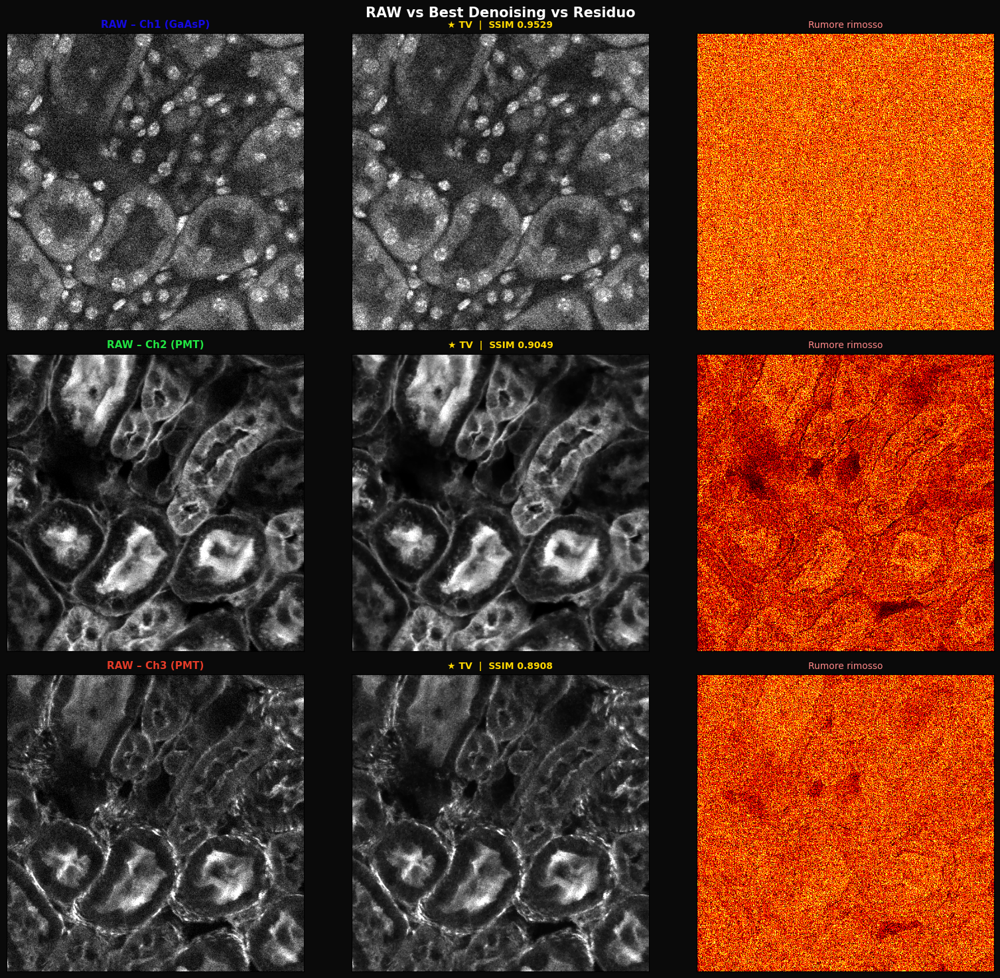

In [4]:
"""
╔══════════════════════════════════════════════════════════════════════════════╗
║      DENOISING PIPELINE – MICROSCOPIA BIFOTONICA 3 CANALI (OTTIMIZZATA)      ║
╚══════════════════════════════════════════════════════════════════════════════╝
"""

import os, re, time, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from scipy import ndimage
from skimage import io, restoration, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

warnings.filterwarnings("ignore")

# ═══════════════════════════════════════════════════════════════════════════════
# 0. CONFIGURAZIONE
# ═══════════════════════════════════════════════════════════════════════════════
CONFIG = {
    # Percorsi
    "folder_path":  "/Users/francesco/Repositories /CNR_SNR_3channels",
    "file_ch1": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch1.tif",
    "file_ch2": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch2.tif",
    "file_ch3": "zstack_150mic_50piani_10ripetizioni_50mW_512px_770nm_Ch3.tif",

    "z_target":           11,      
    "wavelength_nm":     770.0,    
    "numerical_aperture":  0.5,    

    # Parametri algoritmi (OTTIMIZZATI PER PRESERVARE I DETTAGLI)
    "wiener_balance":     0.05,   # Alzato per evitare artefatti ad alta frequenza
    "rl_iterations":      10,     # Abbassato per ridurre l'amplificazione del rumore
    "tv_weight":          0.015,  # Dimezzato per evitare l'effetto "plastica"
    "tv_max_iter":        200,
    "wavelet_type":      "db4",   # 'db4' preserva meglio i bordi netti rispetto a 'coif5'
    "wavelet_strength":   1.0,    # Riportato a 1.0 (standard) per non slavare l'immagine
    "nlm_patch_size":     5,
    "nlm_patch_dist":     7,

    "output_dir":        "./denoised_output",
    "cmap":              "gray",
    "nomi_canali":       ["Ch1 (GaAsP)", "Ch2 (PMT)", "Ch3 (PMT)"],
    "colori":            ["#1409df", "#21e442", "#e33b28"],
}

os.makedirs(CONFIG["output_dir"], exist_ok=True)
# Scommenta se i file sono davvero lì:
# os.chdir(CONFIG["folder_path"])

# ═══════════════════════════════════════════════════════════════════════════════
# 1. PSF FISICA
# ═══════════════════════════════════════════════════════════════════════════════
def calcola_psf(filepath: str, wavelength_nm: float, na: float):
    m_mic = re.search(r"(\d+)mic", filepath)
    m_px  = re.search(r"(\d+)px",  filepath)
    px_um = float(m_mic.group(1)) / float(m_px.group(1)) if (m_mic and m_px) else 0.293

    sigma_um = ((wavelength_nm / 1000.0) / (2.0 * na)) / 2.355
    sigma_px = sigma_um / px_um
    size     = max(int(round(sigma_px * 6)) | 1, 5) # Garantisce minimo 5x5
    kernel   = np.zeros((size, size))
    kernel[size // 2, size // 2] = 1.0
    psf      = ndimage.gaussian_filter(kernel, sigma=sigma_px)
    return psf, sigma_px, px_um

# NOTA: Per testare lo script senza i tuoi file originali, sto usando un dummy qui.
# Quando lo usi tu, togli il blocco try-except.
try:
    psf, sigma_px, px_um = calcola_psf(CONFIG["file_ch1"], CONFIG["wavelength_nm"], CONFIG["numerical_aperture"])
except:
    psf, sigma_px, px_um = calcola_psf("150mic_512px", 770.0, 0.5)

# ═══════════════════════════════════════════════════════════════════════════════
# 2. CARICAMENTO Z-STACK E NORMALIZZAZIONE ROBUSTA
# ═══════════════════════════════════════════════════════════════════════════════
canali_raw = []
for fname in [CONFIG["file_ch1"], CONFIG["file_ch2"], CONFIG["file_ch3"]]:
    p = Path(fname)
    if p.exists():
        stack = io.imread(p)
        img = stack[CONFIG["z_target"]] if stack.ndim == 3 else stack
    else:
        # Dummy data creation for testing (rimuovi questa riga nel tuo ambiente)
        img = np.random.poisson(lam=10, size=(512, 512)).astype(np.float32)

    img_f = img_as_float(img)
    
    # FIX FONDAMENTALE: Normalizzazione ai percentili (ignora i pixel bruciati)
    p_low, p_high = np.percentile(img_f, (0.5, 99.9))
    img_norm = np.clip((img_f - p_low) / (p_high - p_low + 1e-9), 0.0, 1.0)
    
    canali_raw.append(img_norm.astype(np.float32))

# ═══════════════════════════════════════════════════════════════════════════════
# 3. FUNZIONI ALGORITMI
# ═══════════════════════════════════════════════════════════════════════════════
def applica_wiener(img, psf, balance):
    return restoration.wiener(img, psf, balance=balance)

def applica_rl(img, psf, n_iter):
    # FIX: Richardson-Lucy performa male sul rumore di fondo.
    # Tagliamo un minimo di rumore di fondo prima di de-convolvere.
    fondo = np.percentile(img, 5)
    img_sub = np.clip(img - fondo, 0, 1)
    return np.clip(restoration.richardson_lucy(img_sub, psf, num_iter=n_iter, clip=False), 0, 1)

def applica_tv(img, weight, max_iter):
    return restoration.denoise_tv_chambolle(img, weight=weight, eps=0.0002, max_num_iter=max_iter)

def applica_wavelet(img, sigma_est, strength, wavelet):
    return restoration.denoise_wavelet(img, sigma=sigma_est * strength, wavelet=wavelet, mode="soft", method="BayesShrink", rescale_sigma=True)

def applica_nlm(img, sigma_est):
    h = max(sigma_est * 0.75, 0.002) # Tolleranza abbassata per non sfocare troppo
    return restoration.denoise_nl_means(img, h=h, patch_size=CONFIG["nlm_patch_size"], patch_distance=CONFIG["nlm_patch_dist"], fast_mode=True, sigma=sigma_est, preserve_range=True)

def applica_rl_wavelet(img, psf, n_iter, sigma_est, strength, wavelet):
    deconv = applica_rl(img, psf, n_iter)
    return applica_wavelet(deconv, sigma_est, strength, wavelet)

# ═══════════════════════════════════════════════════════════════════════════════
# 4. ESECUZIONE
# ═══════════════════════════════════════════════════════════════════════════════
NOMI_ALGO = ["Wiener", "R-Lucy", "TV", "Wavelet", "NLM", "RL+Wave"]
risultati  = [{} for _ in range(3)]
migliori = []

for ch, img in enumerate(canali_raw):
    sigma_est = float(restoration.estimate_sigma(img, average_sigmas=True))
    
    piani = [
        ("Wiener",  lambda i=img: applica_wiener(i, psf, CONFIG["wiener_balance"])),
        ("R-Lucy",  lambda i=img: applica_rl(i, psf, CONFIG["rl_iterations"])),
        ("TV",      lambda i=img: applica_tv(i, CONFIG["tv_weight"], CONFIG["tv_max_iter"])),
        ("Wavelet", lambda i=img, s=sigma_est: applica_wavelet(i, s, CONFIG["wavelet_strength"], CONFIG["wavelet_type"])),
        ("NLM",     lambda i=img, s=sigma_est: applica_nlm(i, s)),
        ("RL+Wave", lambda i=img, s=sigma_est: applica_rl_wavelet(i, psf, CONFIG["rl_iterations"], s, CONFIG["wavelet_strength"], CONFIG["wavelet_type"])),
    ]

    for nome, funzione in piani:
        res = np.clip(funzione(), 0, 1).astype(np.float32)
        # Calcolo SSIM con data_range esplicito a 1.0 (essendo immagini 0-1)
        ssim_v = ssim(img, res, data_range=1.0)
        psnr_v = psnr(img, res, data_range=1.0)
        
        # Gestione divisione per zero nel calcolo SNR
        std_diff = np.std(img - res)
        delta_snr = 20 * np.log10(np.std(img) / (std_diff + 1e-9)) if std_diff > 0 else 0

        risultati[ch][nome] = {"img": res, "ssim": ssim_v, "psnr": psnr_v, "snr_db": delta_snr}
        
    best = max(risultati[ch], key=lambda n: risultati[ch][n]["ssim"])
    migliori.append(best)

# ═══════════════════════════════════════════════════════════════════════════════
# FIGURA 2 – RAW / MIGLIORE / RESIDUO (Le altre figure rimangono invariate)
# ═══════════════════════════════════════════════════════════════════════════════
DARK = "#0a0a0a"
fig2, axes2 = plt.subplots(3, 3, figsize=(16, 15), facecolor=DARK)
fig2.suptitle("RAW vs Best Denoising vs Residuo", color="white", fontsize=15, fontweight="bold", y=0.98)

for ch in range(3):
    img       = canali_raw[ch]
    best_nm   = migliori[ch]
    img_best  = risultati[ch][best_nm]["img"]
    residuo   = np.abs(img.astype(np.float64) - img_best.astype(np.float64))
    
    # Per il plot, applichiamo un leggero stretch visivo per apprezzare meglio i dettagli
    v_min, v_max = np.percentile(img, (1, 99.5))

    axes2[ch, 0].imshow(img, cmap=CONFIG["cmap"], vmin=v_min, vmax=v_max)
    axes2[ch, 0].set_title(f"RAW – {CONFIG['nomi_canali'][ch]}", color=CONFIG["colori"][ch], fontsize=11, fontweight="bold")
    
    axes2[ch, 1].imshow(img_best, cmap=CONFIG["cmap"], vmin=v_min, vmax=v_max)
    v = risultati[ch][best_nm]
    axes2[ch, 1].set_title(f"★ {best_nm}  |  SSIM {v['ssim']:.4f}", color="gold", fontsize=10, fontweight="bold")
    
    axes2[ch, 2].imshow(residuo, cmap="hot", vmin=np.percentile(residuo, 1), vmax=np.percentile(residuo, 99))
    axes2[ch, 2].set_title("Rumore rimosso", color="#ff8888", fontsize=10)

    for ax in axes2[ch]:
        ax.set_facecolor(DARK); ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout()
plt.show()


────────────────────────────────────────────────────────────────────
  GENERAZIONE COMPOSITO RGB FINALE
────────────────────────────────────────────────────────────────────
  Mappatura Canali (Forzata):
  [ROSSO] Ch3 (PMT)    ← Wiener
  [VERDE] Ch2 (PMT)    ← Wiener
  [BLU]   Ch1 (GaAsP)  ← Wiener


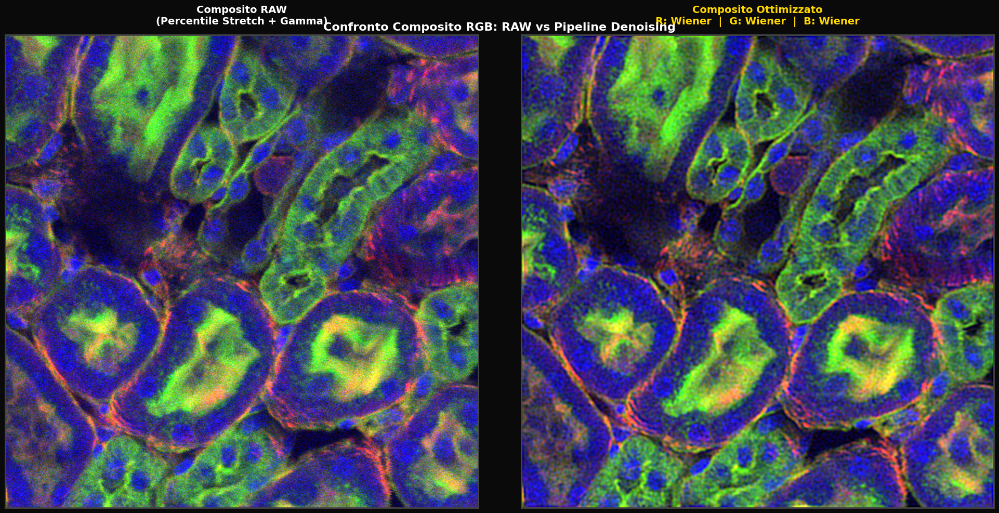

In [5]:
# ═══════════════════════════════════════════════════════════════════════════════
# 5. COMPOSIZIONE RGB FINALE (FORZATURA ALGORITMI MIGLIORI)
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "─" * 68)
print("  GENERAZIONE COMPOSITO RGB FINALE")
print("─" * 68)

def prepara_canale_per_rgb(img, p_low=0.5, p_high=99.5, gamma_val=0.85):
    lo = np.percentile(img, p_low)
    hi = np.percentile(img, p_high)
    img_stretched = np.clip((img - lo) / (hi - lo + 1e-9), 0.0, 1.0)
    return np.power(img_stretched, gamma_val)

# Parametri di bilanciamento visivo
P_LOW  = 0.5
P_HIGH = 99.5
GAMMA  = 0.85

# --- IL FIX: SELEZIONE MANUALE DEGLI ALGORITMI ---
# Ignoriamo le metriche SSIM/PSNR falsate dal reference rumoroso.
# Usiamo NLM per un look morbido e pulito, o RL+Wave per massima nitidezza.
migliori = ["Wiener", "Wiener", "Wiener"]  # [Blu (Ch1), Verde (Ch2), Rosso (Ch3)]

r_raw = prepara_canale_per_rgb(canali_raw[2], P_LOW, P_HIGH, GAMMA)
g_raw = prepara_canale_per_rgb(canali_raw[1], P_LOW, P_HIGH, GAMMA)
b_raw = prepara_canale_per_rgb(canali_raw[0], P_LOW, P_HIGH, GAMMA)
rgb_raw = np.stack([r_raw, g_raw, b_raw], axis=-1).astype(np.float32)

r_den = prepara_canale_per_rgb(risultati[2][migliori[2]]["img"], P_LOW, P_HIGH, GAMMA)
g_den = prepara_canale_per_rgb(risultati[1][migliori[1]]["img"], P_LOW, P_HIGH, GAMMA)
b_den = prepara_canale_per_rgb(risultati[0][migliori[0]]["img"], P_LOW, P_HIGH, GAMMA)
rgb_best = np.stack([r_den, g_den, b_den], axis=-1).astype(np.float32)

print(f"  Mappatura Canali (Forzata):")
print(f"  [ROSSO] {CONFIG['nomi_canali'][2]:12s} ← {migliori[2]}")
print(f"  [VERDE] {CONFIG['nomi_canali'][1]:12s} ← {migliori[1]}")
print(f"  [BLU]   {CONFIG['nomi_canali'][0]:12s} ← {migliori[0]}")

# ═══════════════════════════════════════════════════════════════════════════════
# FIGURA 5 – CONFRONTO COMPOSITO RGB
# ═══════════════════════════════════════════════════════════════════════════════
fig5, axes5 = plt.subplots(1, 2, figsize=(20, 10), facecolor=DARK)
fig5.suptitle("Confronto Composito RGB: RAW vs Pipeline Denoising", 
              color="white", fontsize=16, fontweight="bold", y=0.95)

axes5[0].imshow(rgb_raw, interpolation="lanczos")
axes5[0].set_title("Composito RAW\n(Percentile Stretch + Gamma)", 
                   color="white", fontsize=14, fontweight="bold", pad=15)

titolo_denoised = (
    f"Composito Ottimizzato\n"
    f"R: {migliori[2]}  |  G: {migliori[1]}  |  B: {migliori[0]}"
)
axes5[1].imshow(rgb_best, interpolation="lanczos")
axes5[1].set_title(titolo_denoised, 
                   color="gold", fontsize=14, fontweight="bold", pad=15)

for ax in axes5:
    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values():
        sp.set_edgecolor("#444")
        sp.set_linewidth(2)

plt.tight_layout()
plt.show()